In [1]:
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import os
import cv2
import random

dataImages = []
solutionImages = []

IMAGE_SIZE = 256

In [2]:
def loadImagesInArray(path):
    ret = []
    for image in os.listdir(path): 
        img_array = cv2.imread(os.path.join(path, image)) #, cv2.IMREAD_GRAYSCALE)
        #print("Image Size: " + str(img_array.shape))
        img_array = cv2.resize(img_array, (IMAGE_SIZE, IMAGE_SIZE))
        #print("Resized Image Size: " + str(img_array.shape))        
        ret.append(img_array)
        #plt.imshow(img_array)
        #print(img_array)
    return ret


In [3]:
image_Array = loadImagesInArray("E:\\OneDrive\\Programming\\TU-Freiberg-Kamera\\SampleImages\\dataset\\image\\")
print("I have found " + str(len(image_Array)) + " images.")
mask_Array = loadImagesInArray("E:\\OneDrive\\Programming\\TU-Freiberg-Kamera\\SampleImages\\dataset\\result\\")
print("I have found " + str(len(mask_Array))+ " masks.")

I have found 54 images.
I have found 54 masks.


In [4]:
#test fif there are pixels other than class 1 or class 3 
counter = 0
array = []
for x in mask_Array[0]: 
    for y in x: 
        y = tuple(y)
        #print(y)
        if y != (255, 0, 0) and y != (0, 0, 255):
            counter = counter + 1
            array.append(y)
print(counter)
print(array)

167
[(190, 0, 65), (48, 0, 207), (48, 0, 207), (48, 0, 207), (57, 0, 198), (211, 0, 44), (57, 0, 198), (68, 0, 187), (131, 0, 124), (57, 0, 198), (25, 0, 230), (140, 0, 115), (188, 0, 67), (138, 0, 117), (36, 0, 219), (95, 0, 160), (2, 0, 253), (122, 0, 133), (52, 0, 203), (86, 0, 169), (41, 0, 214), (126, 0, 129), (253, 0, 2), (235, 0, 20), (235, 0, 20), (235, 0, 20), (235, 0, 20), (235, 0, 20), (235, 0, 20), (238, 0, 17), (238, 0, 17), (235, 0, 20), (235, 0, 20), (235, 0, 20), (235, 0, 20), (235, 0, 20), (235, 0, 20), (235, 0, 20), (235, 0, 20), (235, 0, 20), (235, 0, 20), (235, 0, 20), (235, 0, 20), (235, 0, 20), (235, 0, 20), (235, 0, 20), (235, 0, 20), (235, 0, 20), (235, 0, 20), (235, 0, 20), (235, 0, 20), (39, 0, 215), (74, 0, 180), (188, 0, 67), (75, 0, 180), (238, 0, 17), (75, 0, 180), (97, 0, 158), (11, 0, 244), (43, 0, 212), (188, 0, 67), (136, 0, 119), (1, 0, 254), (133, 0, 122), (231, 0, 24), (14, 0, 241), (66, 0, 189), (66, 0, 189), (149, 0, 105), (96, 0, 159), (116, 0, 1

In [5]:
def normalize(input_image, input_mask): 
    input_image = tf.cast(input_image, tf.float32) / 255.0
    input_mask = input_mask # evtl noch umbasteln, dass jede position entweder 0 oder 1 (evtl 2) ist >> 0 - nüx, 1 - street, (2? rand?)
    return input_image, input_mask

In [6]:
def load_image_test(input_image, input_mask): #rezizes the images to 128x128
  output_image = tf.image.resize(input_image, (IMAGE_SIZE, IMAGE_SIZE))
  output_mask = tf.image.resize(input_mask, (IMAGE_SIZE, IMAGE_SIZE))

  output_image, output_mask = normalize(output_image, output_mask)

  return input_image, input_mask

In [7]:
image, mask = load_image_test(image_Array, mask_Array)

In [8]:
def display(display_list):
  plt.figure(figsize=(15, 15))

  title = ['Input Image', 'True Mask', 'Predicted Mask']

  for i in range(len(display_list)):
    plt.subplot(1, len(display_list), i+1)
    plt.title(title[i])
    plt.imshow(tf.keras.preprocessing.image.array_to_img(display_list[i]))
    plt.axis('on')
  plt.show()

In [9]:
def getTestData(input_image, input_mask): 
    data = []
    for index in range(len(input_image)): 
        data.append( (input_image[index], input_mask[index]) )

    temp = data.copy()
    for img, mask in temp: 
        t1 = tf.image.flip_left_right(img)
        t2 = tf.image.flip_left_right(mask)
        data.append( (t1, t2) )

    index = len(data)*0.1
    

    

Index: 0


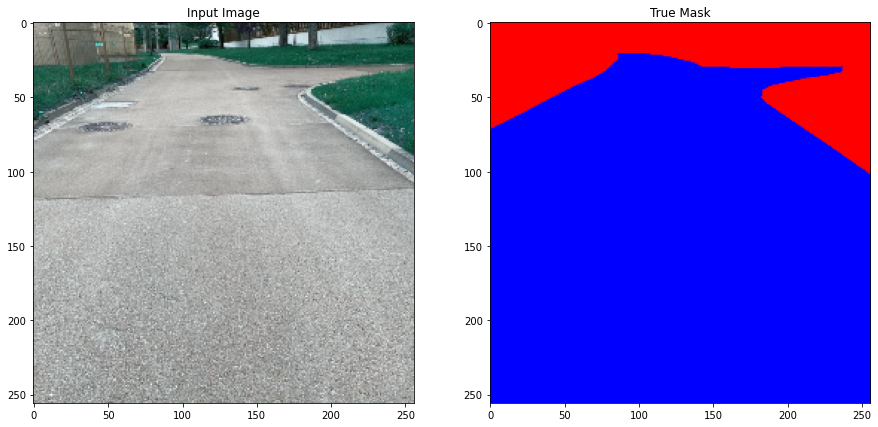

Index: 1


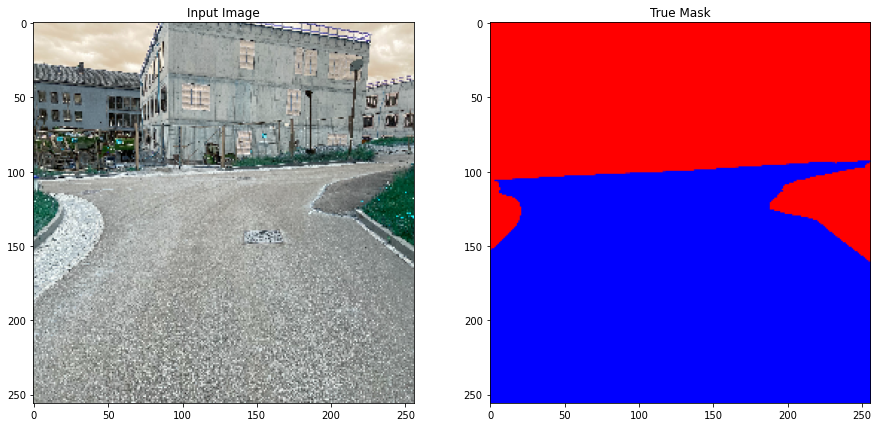

Index: 2


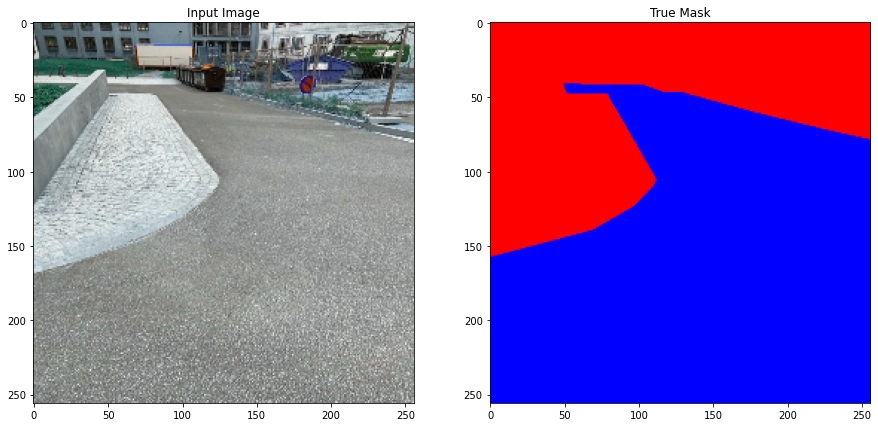

Index: 3


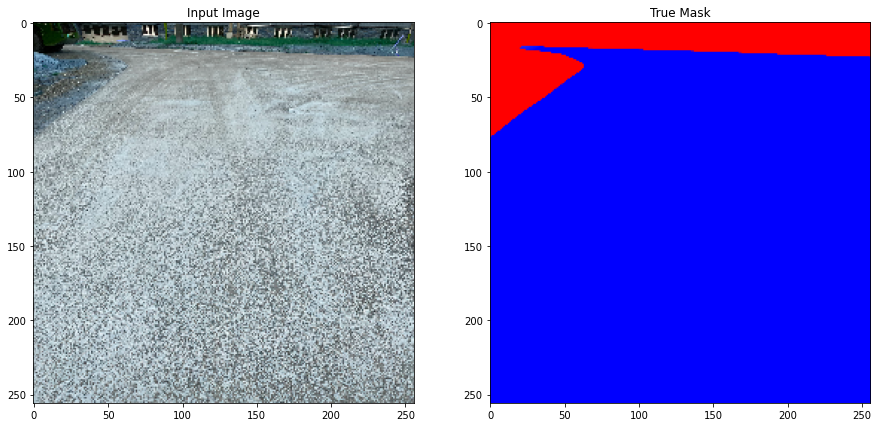

Index: 4


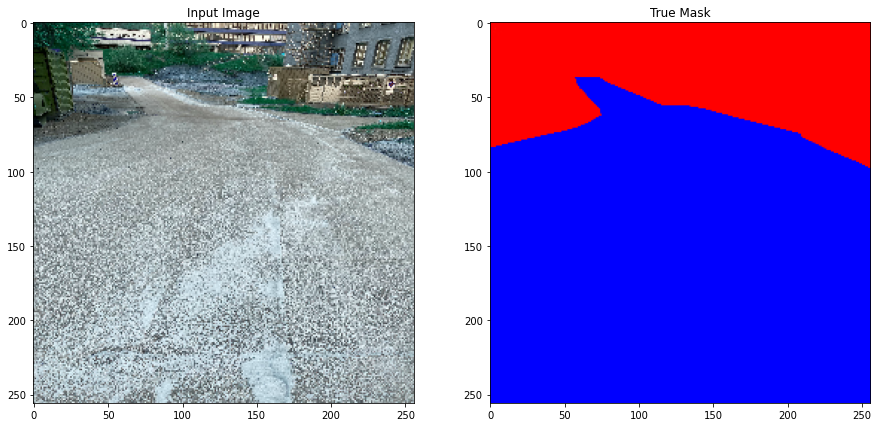

Index: 5


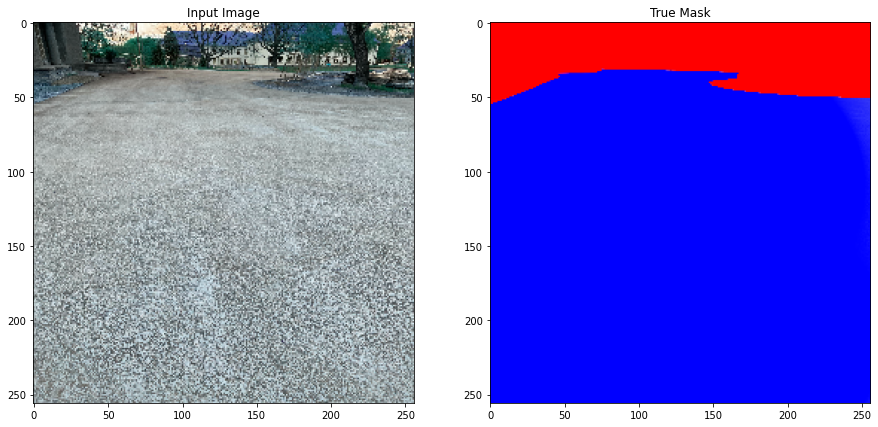

Index: 6


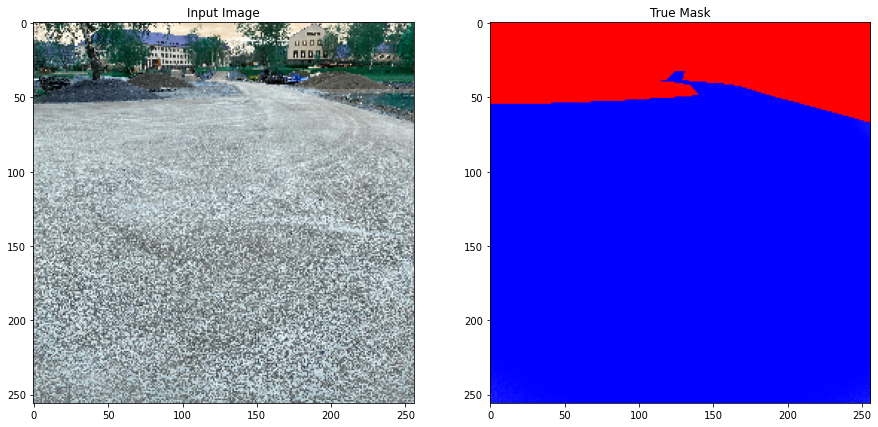

Index: 7


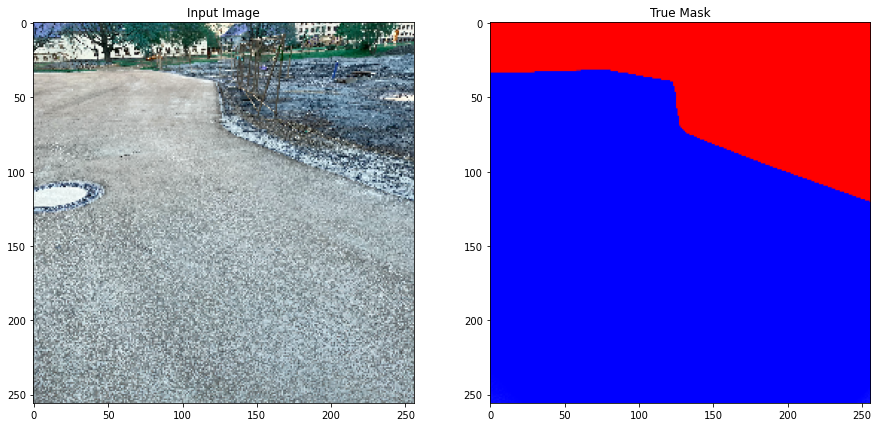

Index: 8


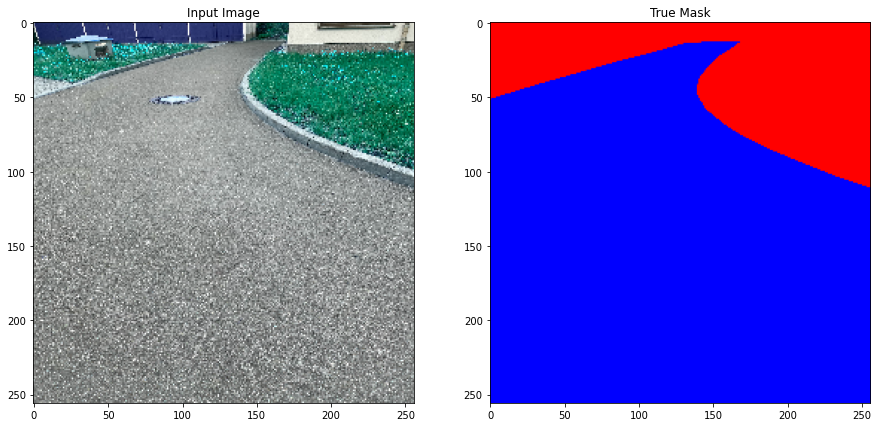

Index: 9


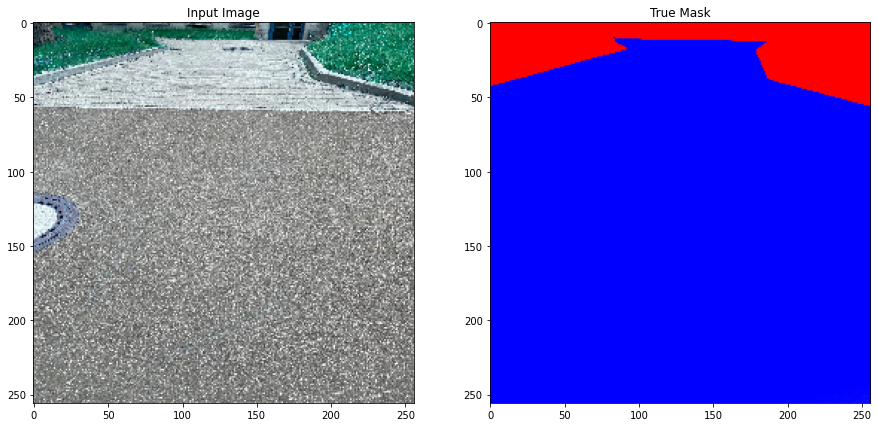

Index: 10


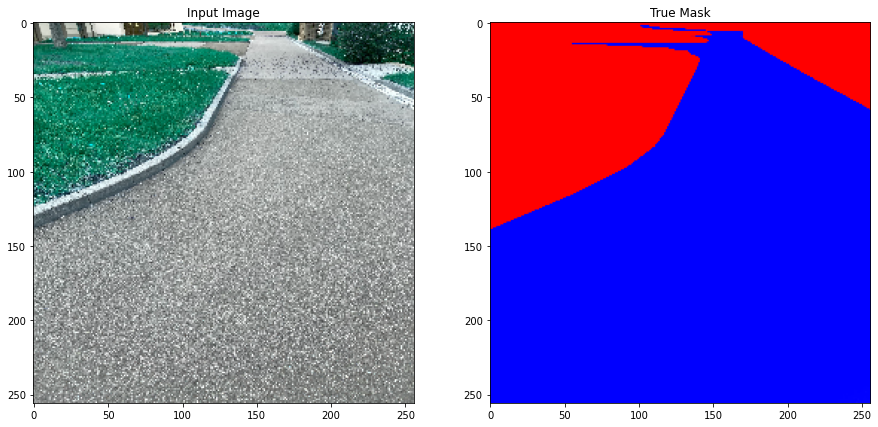

Index: 11


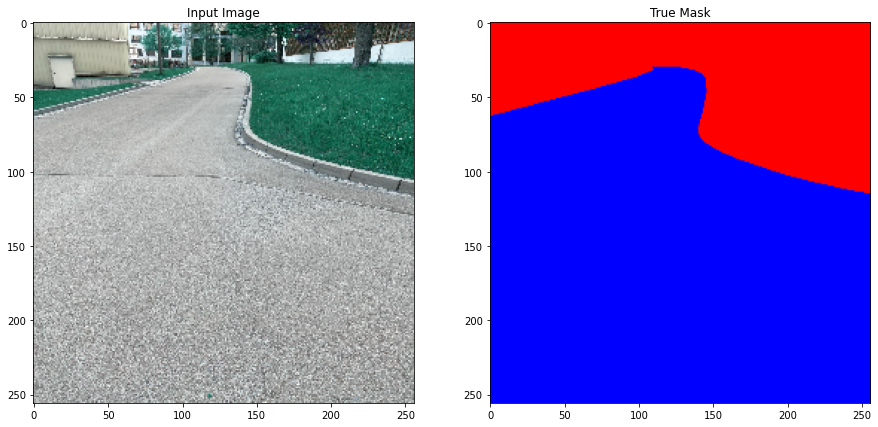

Index: 12


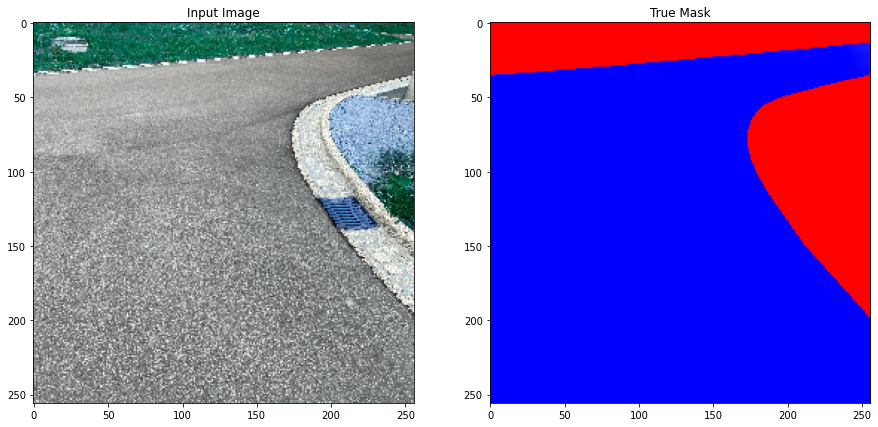

Index: 13


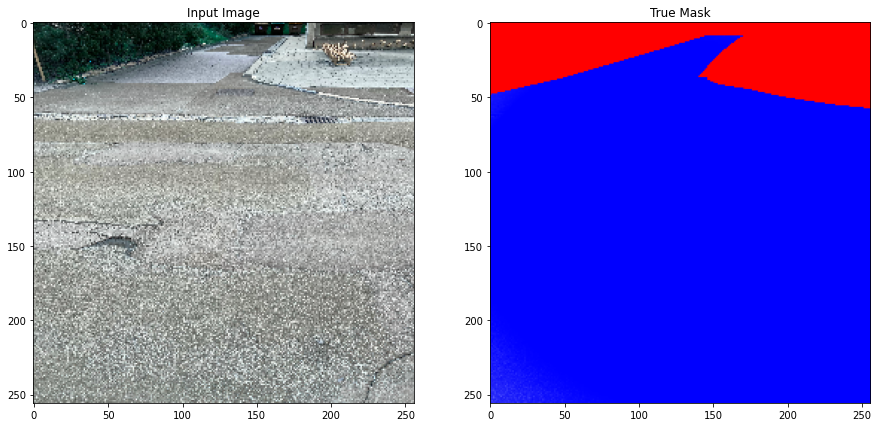

Index: 14


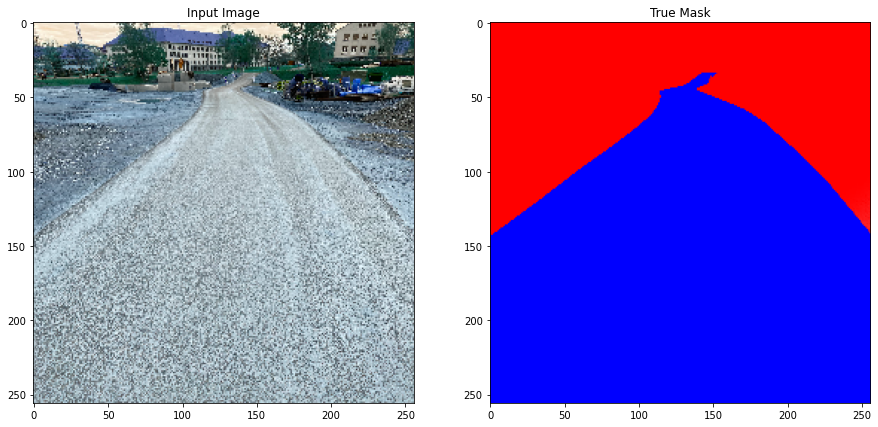

Index: 15


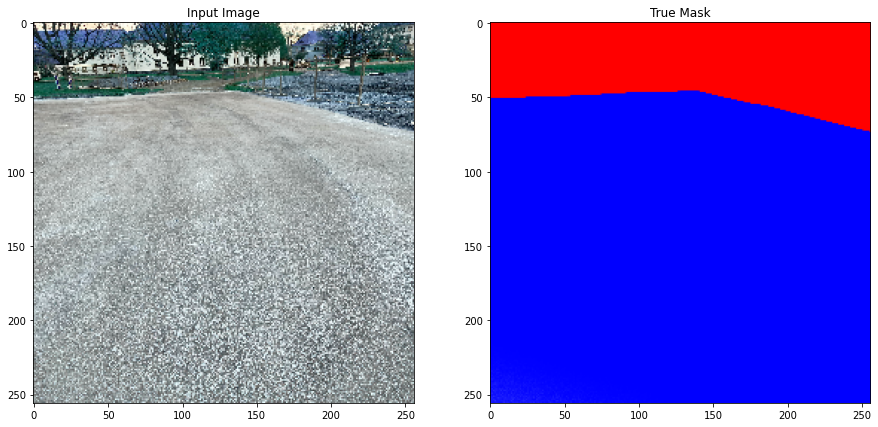

Index: 16


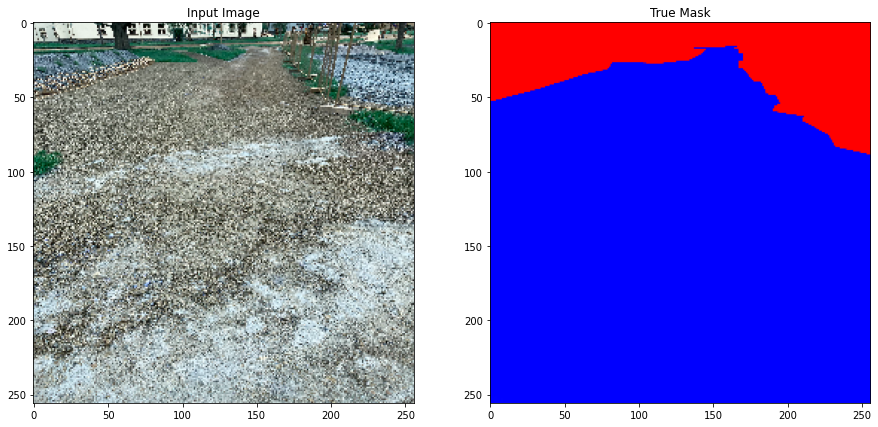

Index: 17


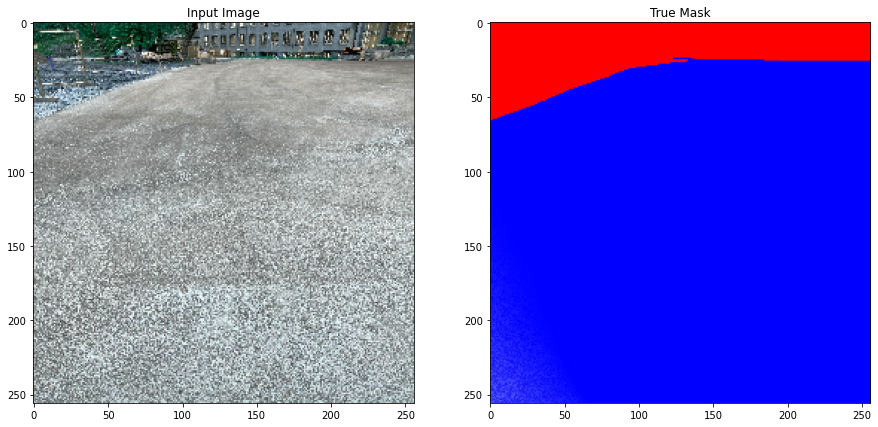

Index: 18


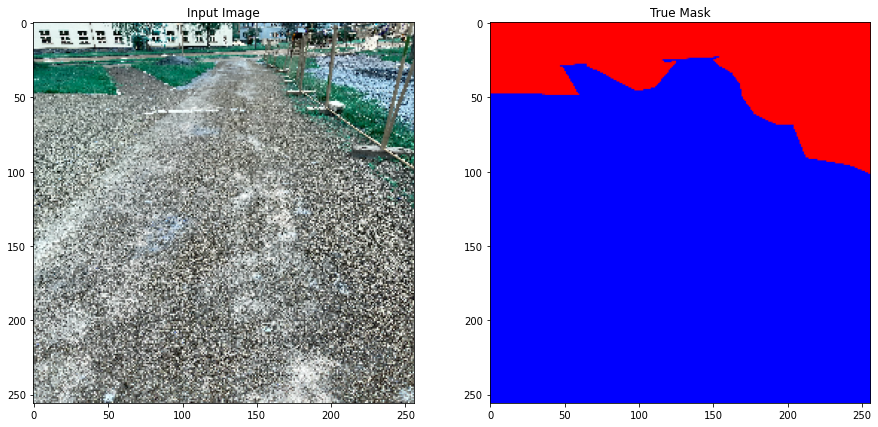

Index: 19


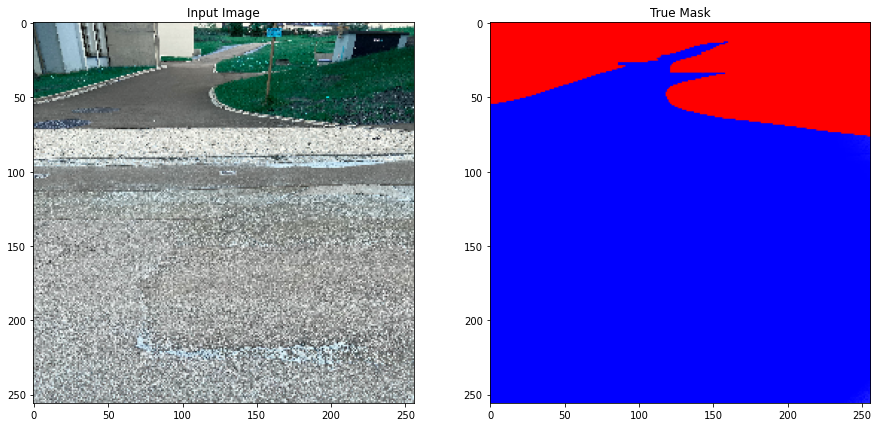

Index: 20


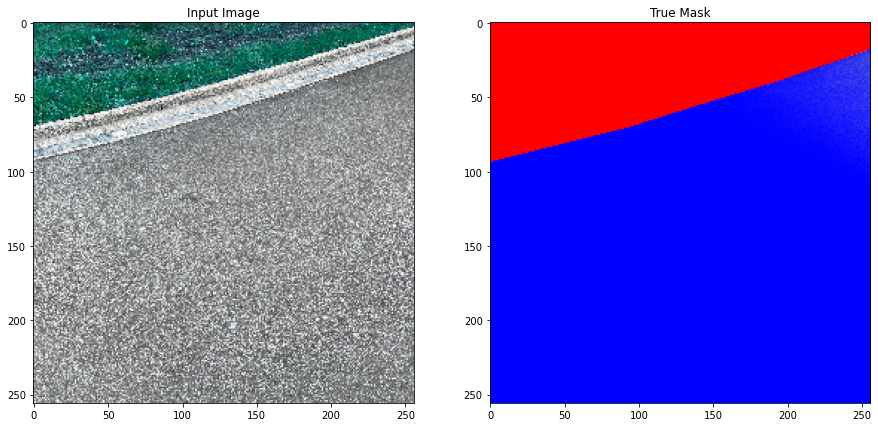

Index: 21


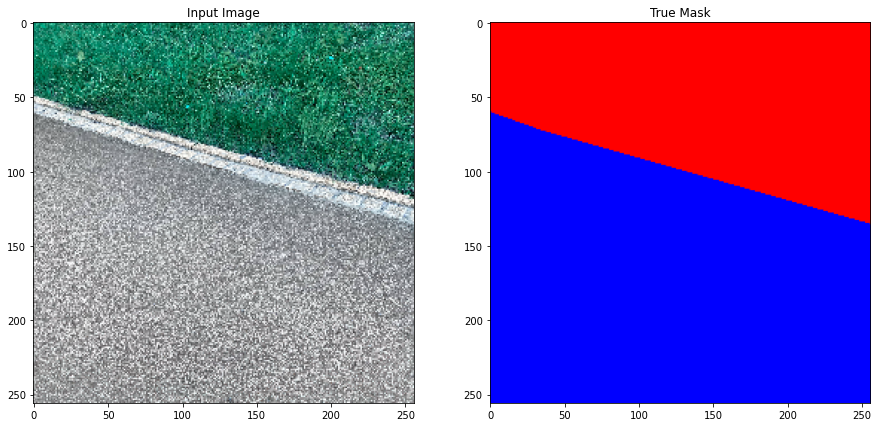

Index: 22


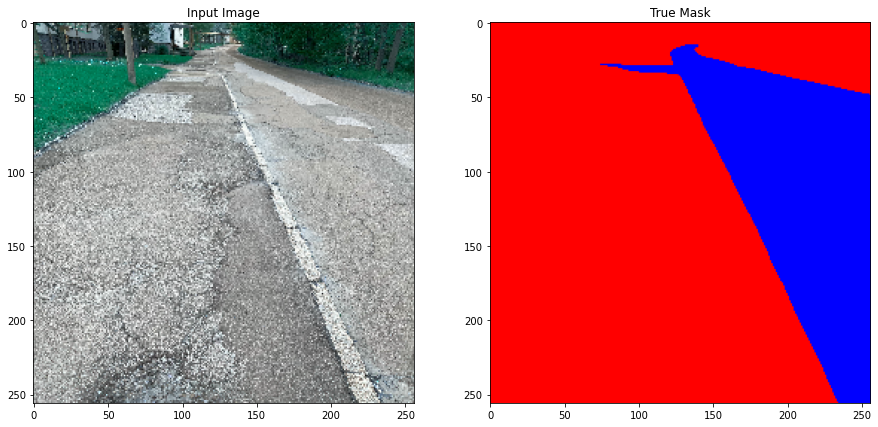

Index: 23


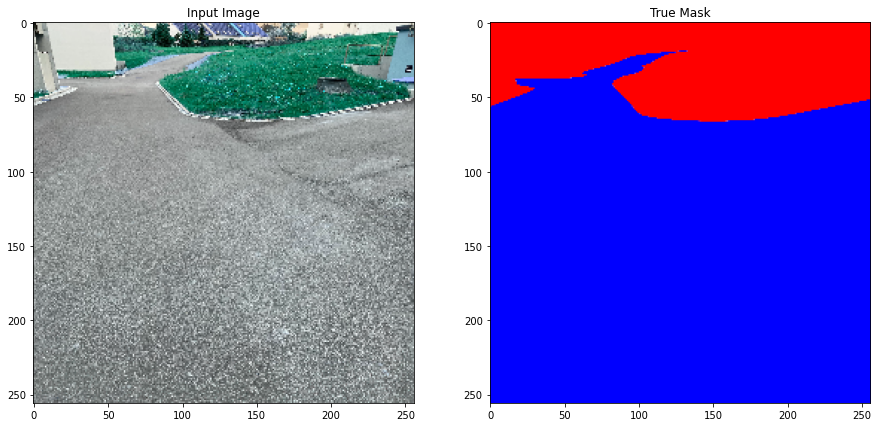

Index: 24


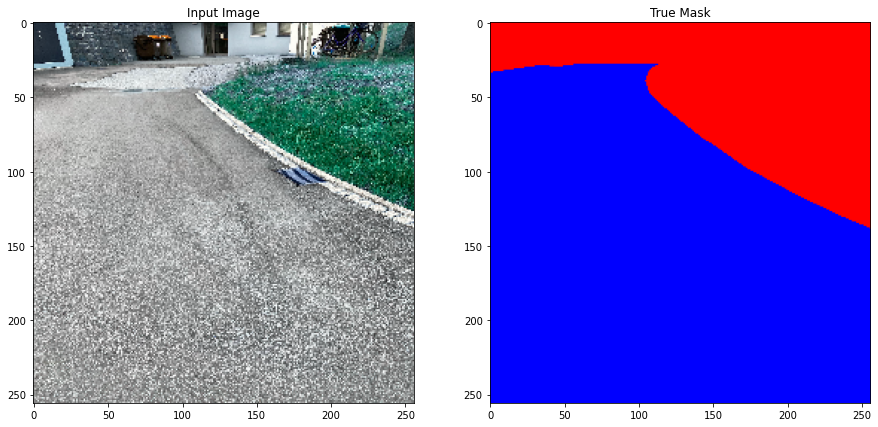

Index: 25


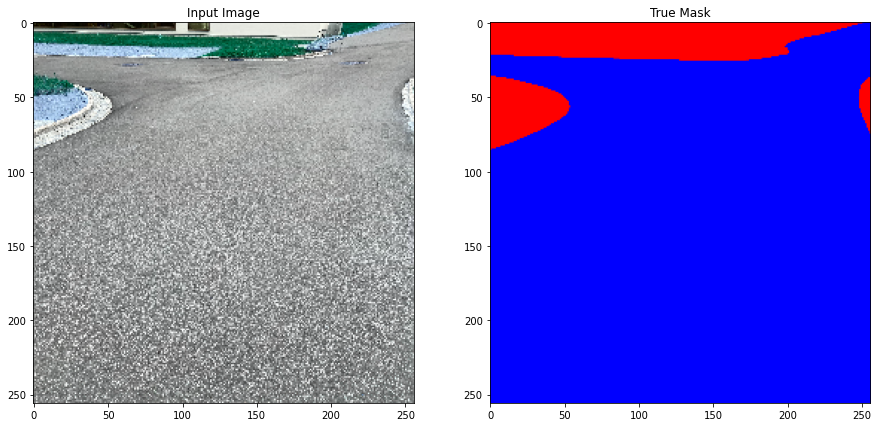

Index: 26


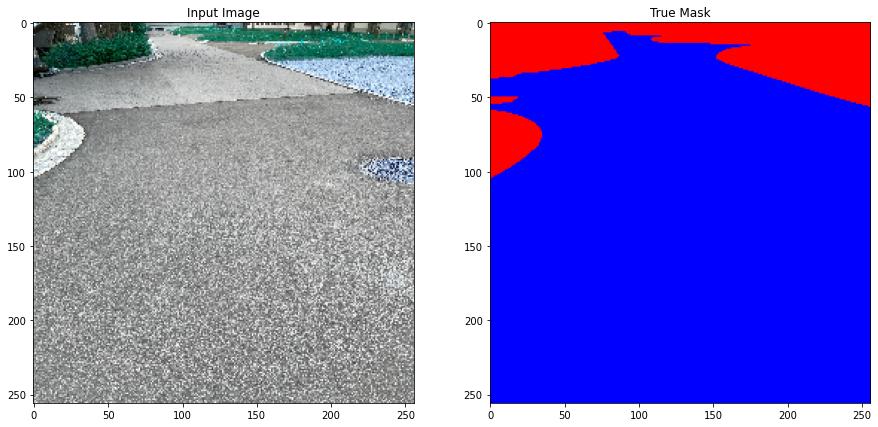

Index: 27


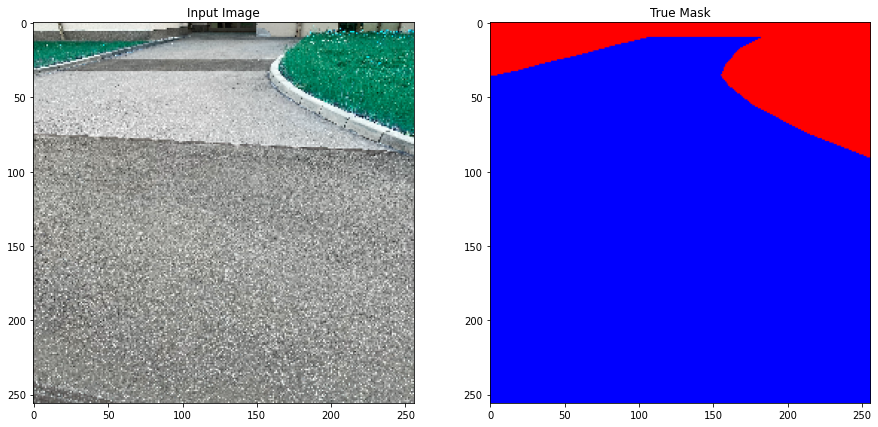

Index: 28


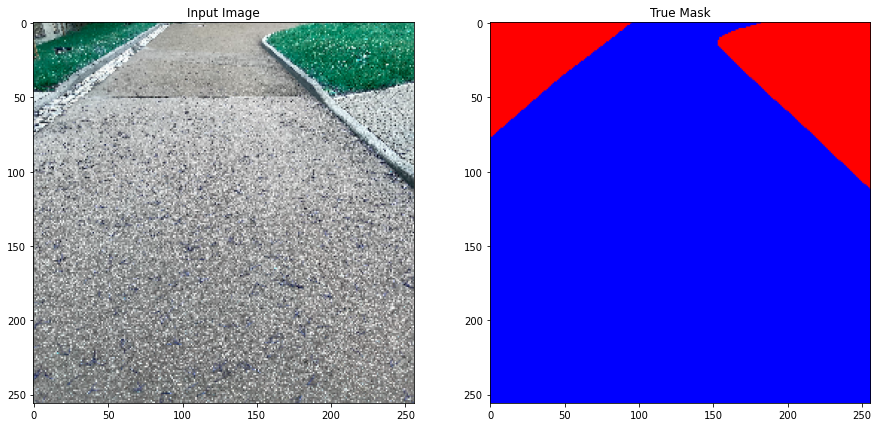

Index: 29


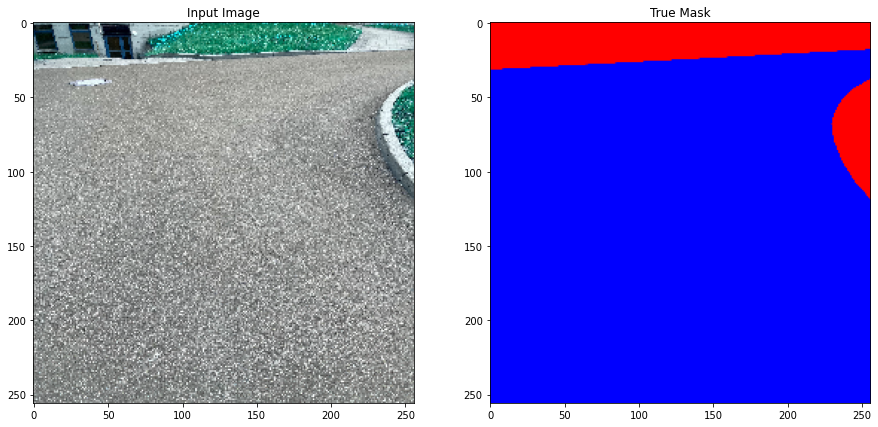

Index: 30


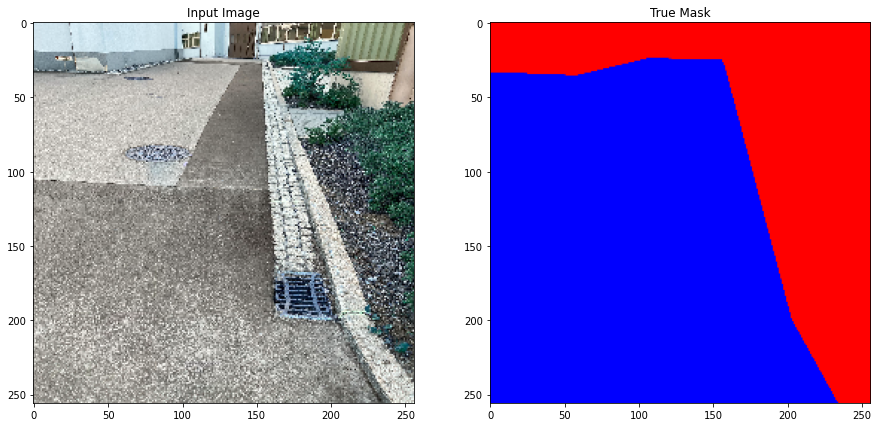

Index: 31


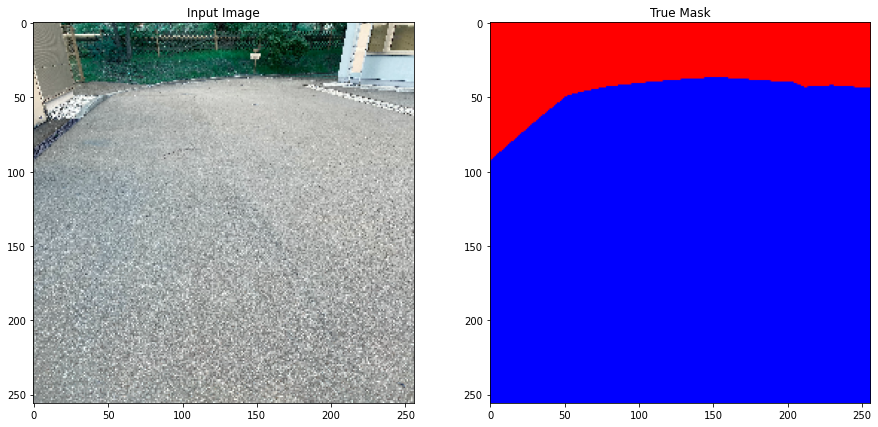

Index: 32


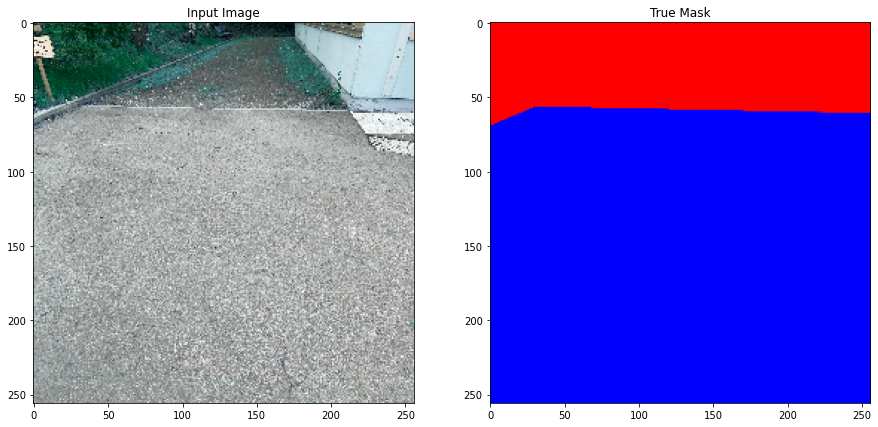

Index: 33


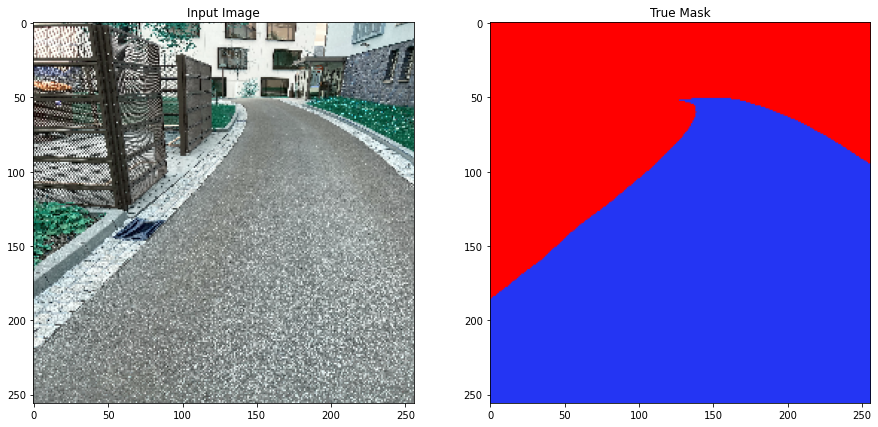

Index: 34


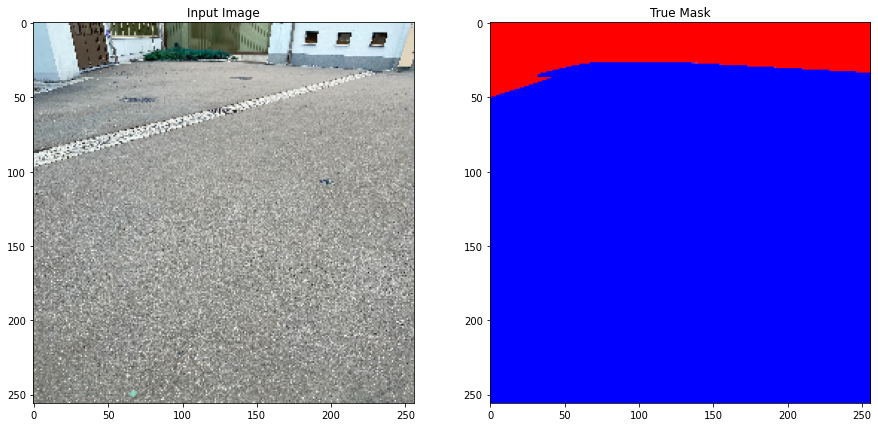

Index: 35


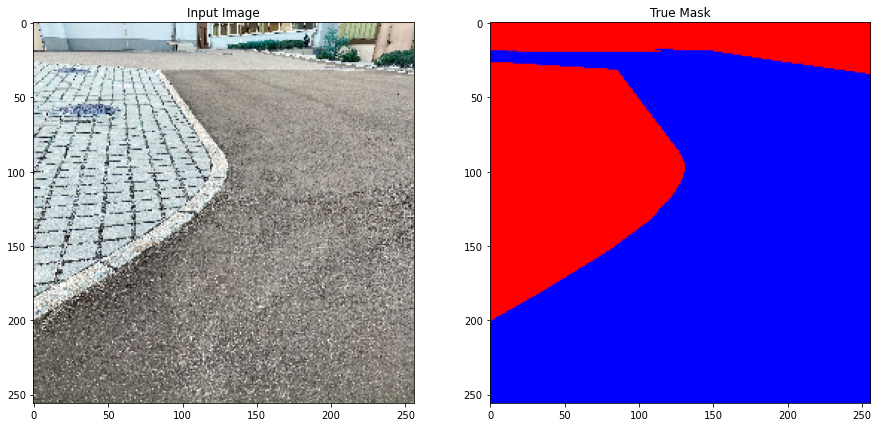

Index: 36


In [10]:
title = ['Input Image', 'True Mask']
for i in range(len(image)): 
    print("Index: " + str(i))
    display([image[i], mask[i]])


In [ ]:
#train = #trainingsdata - randome collected out of the dataset
#test = #testdata 
getTestData(image, mask)




# function welche aufgerufen wird... um einen gewissen % satz aus den daten zu greifen, zum trainiern und testen...
# https://youtu.be/j-3vuBynnOE?t=530
# https://www.tensorflow.org/tutorials/images/segmentation#next_steps
#
# 
#